In [1]:
import numpy as np
import dapy.filters as filters
import dapy.utils.pou as pou
import dapy.utils.localisation as localisation
import dapy.ot as ot
from dapy.models import SpatialLaminarFlameModel
import matplotlib.pyplot as plt
import matplotlib.colors as colors
%matplotlib inline
plt.style.use('seaborn-white')
plt.rcParams['figure.dpi'] = 100

## Model

This model is a stochastic variant of the [Kuramato-Sivashinsky fourth-order nonlinear partial differential equation](https://en.wikipedia.org/wiki/Kuramoto%E2%80%93Sivashinsky_equation) [1, 2], a model for laminar flame fronts which exhibits spatio-temporal chaos.

The governing stochastic partial differential equation (SPDE) is

$$\mathrm{d}X(s, \tau) = -(\partial_0^4 X(s, \tau) + \partial^2_0 X(s, \tau) + X(s, \tau) \partial_0 X(s, \tau) + \gamma X(s, \tau)) \mathrm{d}\tau + \kappa(s) \circledast \mathrm{d}W(s, \tau)$$

where $s$ is the spatial coordinate in a periodic one-dimensional domain $[0, S)$, $\tau$ the time
coordinate, $X(s, \tau)$ the state field process, $\gamma$ a coefficient controlling the
degree of damping in the dynamics, $W(s, \tau)$ a space-time white noise process,
$\kappa(s)$ a spatial smoothing kernel and $\circledast$ indicates circular convolution in the
spatial coordinate.

Using a spectral collocation based spatial discretisation on a mesh of $M$ equispaced nodes such that 

$$X(s, \tau) = \sum_{k=-K}^K \tilde{X}_k(\tau) \exp(i\omega_k s), \quad \tilde{X}_{-k}(\tau) = \tilde{X}_{k}(\tau)^* ~\forall k \in 1{:}K, \quad \omega_k = 2 \pi k / S ~\forall k \in -K{:}K, \quad K = \lfloor M / 2 \rfloor$$

this corresponds to a non-linear system of stochastic differential equations (SDEs) in the complex Fourier coefficients $\tilde{X}_{0:K}$

$$
  \DeclareMathOperator{\DFT}{\mathsf{DFT}}
  \mathrm{d}\tilde{X}_k(\tau) = (\omega_k^4 - \omega_k^2 - \gamma) \tilde{X}_k(\tau) + \frac{i\omega_k}{2} \DFT_k(\DFT^{-1}(\tilde{X}_{0:K}(\tau))^2) + \tilde{\kappa}_k \mathrm{d}\tilde{W}_k(\tau) \quad \forall k \in \{ 0, \dots, K \}
$$

where $\tilde{W}_{0:K}(\tau)$ are complex-valued Wiener processes and $\tilde{\kappa}_{0:K}$ are the Fourier coefficients of
the smoothing kernel $\kappa(s)$.

A Fourier-domain exponential time-differencing integrator with 4th order Runge-Kutta updates for non-linear terms [3, 4] is used to integrate the deterministic component of the SDE dynamics and an Euler-Maruyama discretisation used for the Wiener process increment, with time step $\Delta$.

The smoothing kernel Fourier coefficients are assumed to be

$$\tilde{\kappa}_k = \sigma \exp(-\omega_k^2 \ell^2) \sqrt{M / S} $$

where $\sigma$ is a parameter controlling the amplitude and $\ell$ a parameter controlling
the length scale.

Here we use $S = 32\pi$, $M=512$, $\Delta = 0.25$, $\ell = 1$, $\sigma = 1$ and $\gamma = \frac{1}{6}$.

The state is noisily observed every 10 time steps at 64 equispaced spatial mesh nodes with independent additive Gaussian noise of standard deviation 0.5 at each observation point.

### References

  1. Kuramoto and Tsuzuki. Persistent propagation of concentration waves
     in dissipative media far from thermal equilibrium.
     Progress in Theoretical Physcs, 55 (1976) pp. 356–369.
  2. Sivashinsky. Nonlinear analysis of hydrodynamic instability in laminar
     flames I. Derivation of basic equations.
     Acta Astronomica, 4 (1977) pp. 1177–1206.
  3. Kassam, Aly-Khan and Trefethen, Lloyd N.
     Fourth-order time-stepping for stiff PDEs.
     SIAM Journal on Scientific Computing 26.4 (2005): 1214-1233.
  4. Cox, Steven M. and Matthews, Paul C.
     Exponential time differencing for stiff systems.
     Journal of Computational Physics 176.2 (2002): 430-455.

In [2]:
model_params = {
    'dim_state': 512,
    'observation_space_indices': slice(4, None, 8),
    'time_step': 0.25,
    'domain_extent': 32 * np.pi,
    'damping_coeff': 1. / 6.,
    'observation_noise_std': 0.5,
    'initial_state_amplitude': 1.,
    'state_noise_amplitude': 1.,
    'state_noise_length_scale': 1.,
}
model = SpatialLaminarFlameModel(**model_params)

## Generate data from model

In [3]:
observation_time_indices = np.arange(10, 2001, 10)
seed = 20190117
rng = np.random.default_rng(seed)
state_sequence, observation_sequence = model.sample_state_and_observation_sequences(
    rng, observation_time_indices, return_states_at_all_times=True)

Sampling: 100%|██████████|2001/2001 [00:03<00:00, 552.99time-steps/s]

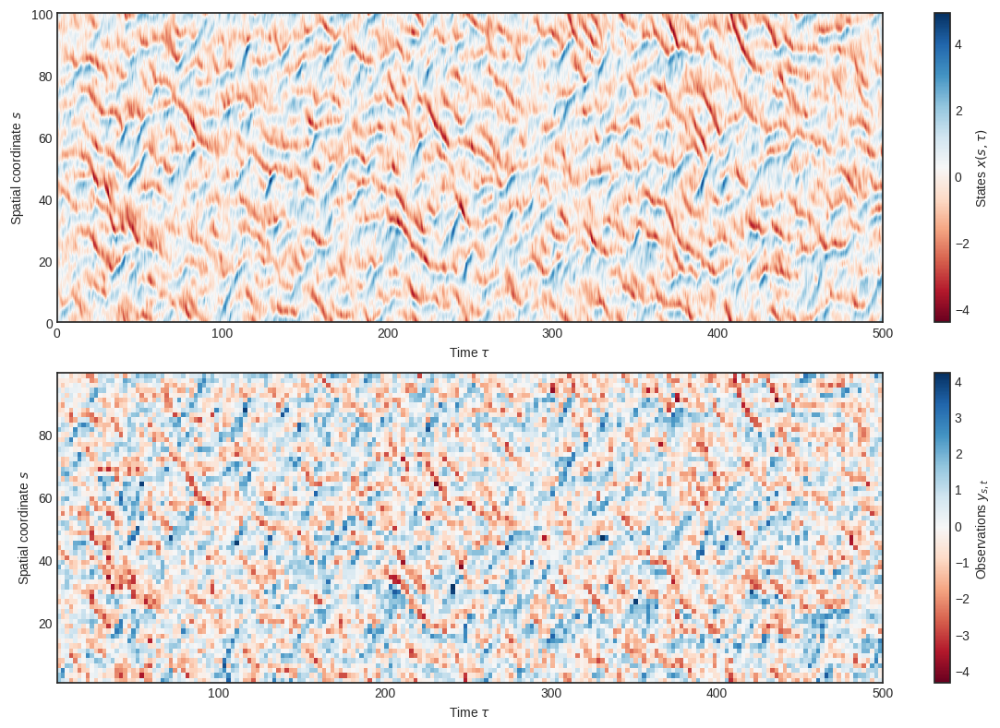

In [4]:
fig, axes = plt.subplots(2, 1, squeeze=True, figsize=(12, 8))
num_time_indices = observation_time_indices.max()
times = np.linspace(0, num_time_indices * model.time_step, num_time_indices + 1)
for ax, sequence, ts, ss, label in zip(
    axes,
    (state_sequence, observation_sequence), 
    (times, times[observation_time_indices]),
    (model.mesh_node_coords[:, 0], model.observation_coords[:, 0]),
    ('States $x(s, \\tau)$', 'Observations $y_{s, t}$')
):
    artist = ax.pcolormesh(ts, ss, sequence.T, cmap='RdBu')
    ax.set_xlabel('Time $\\tau$')
    ax.set_ylabel('Spatial coordinate $s$')
    fig.colorbar(artist, ax=ax, label=label)
fig.tight_layout()

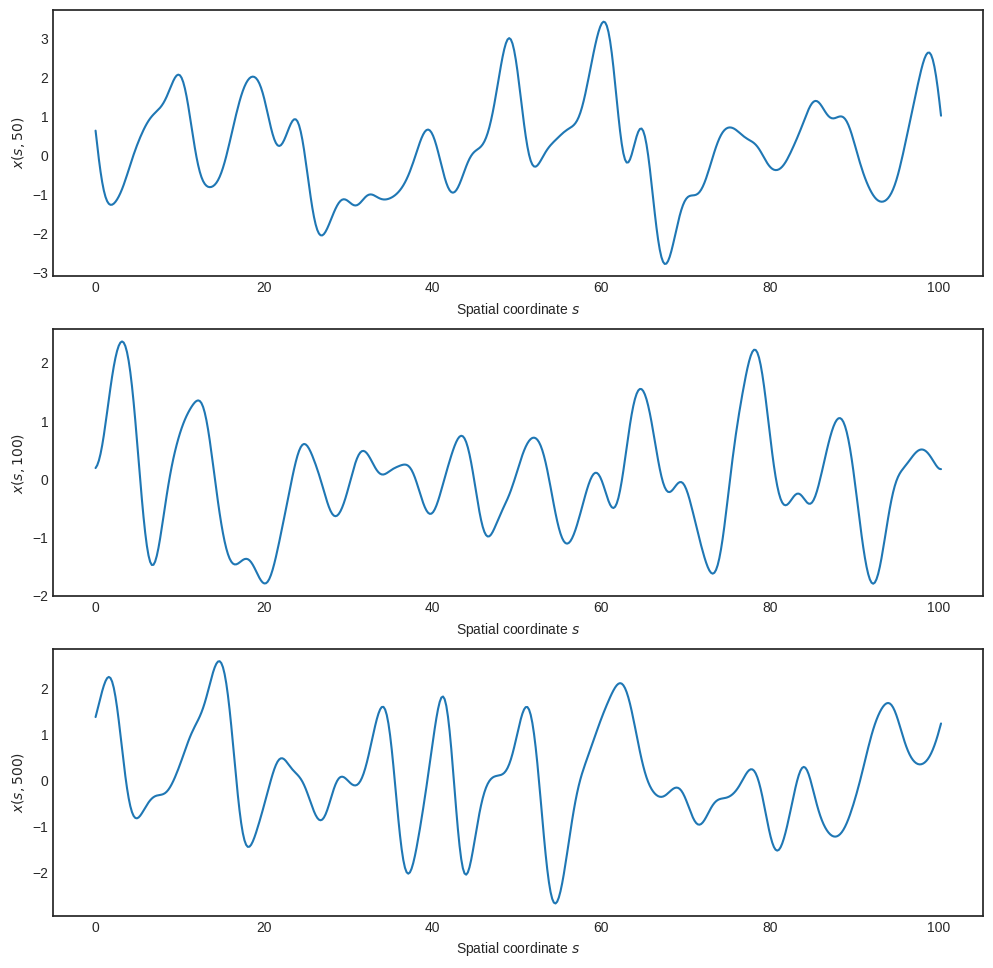

In [5]:
plot_time_indices = [200, 400, -1]
fig, axes = plt.subplots(len(plot_time_indices), 1, figsize=(12, len(plot_time_indices) * 4))
for t, ax in zip(plot_time_indices, axes):
    _ = ax.plot(model.mesh_node_coords[:, 0], state_sequence[t, :])
    ax.set_xlabel('Spatial coordinate $s$')
    ax.set_ylabel(f'$x(s, {times[t]:.3g})$')

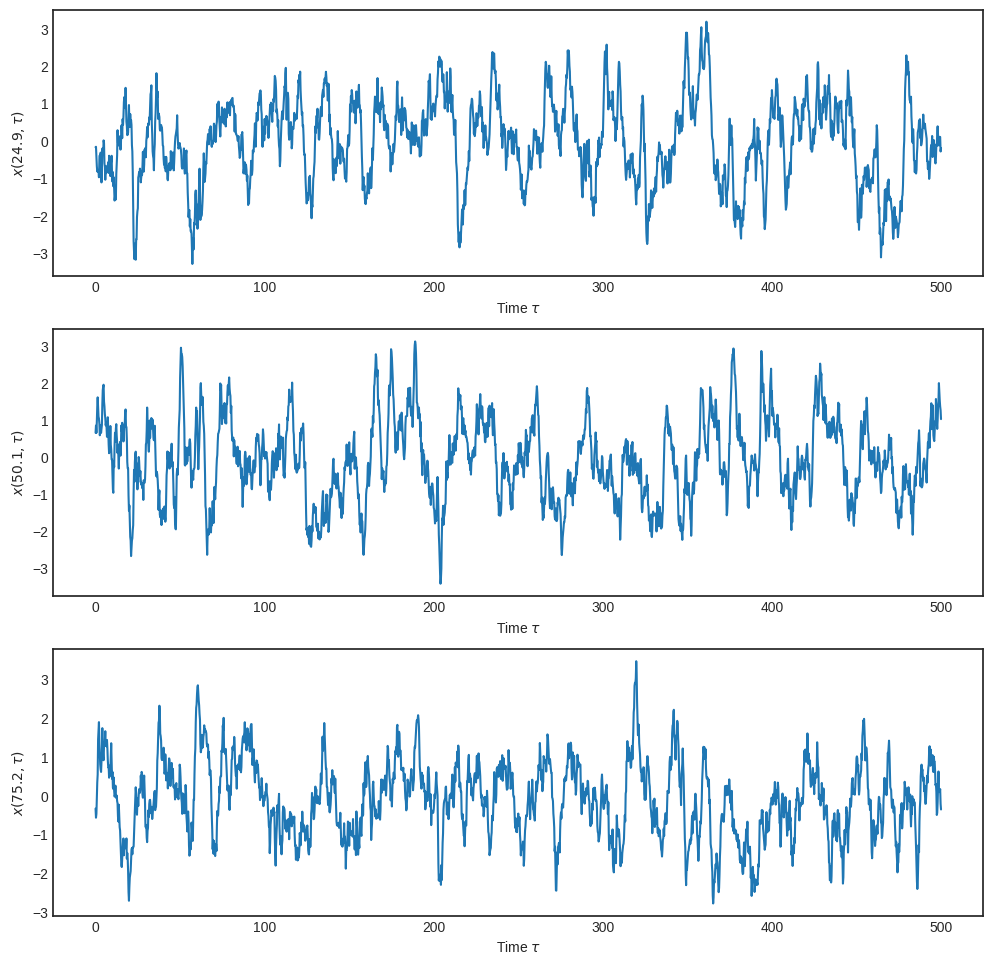

In [6]:
plot_space_indices = [127, 255, 383]
fig, axes = plt.subplots(len(plot_space_indices), 1, 
                         figsize=(12, len(plot_space_indices) * 4))
for s, ax in zip(plot_space_indices, axes):
    _ = ax.plot(times, state_sequence[:, s])
    ax.set_xlabel('Time $\\tau$')
    ax.set_ylabel(f'$x({model.mesh_node_coords[s, 0]:.3g}, \\tau)$')

## Infer state from observations

In [7]:
def plot_results(results, plot_indices, use_space_indices,
                 slice_coordinates, fixed_coordinates, state_sequence, 
                 plot_particles=False, plot_region=True, 
                 particle_skip=2, trace_alpha=0.5):
    fig, axes = plt.subplots(nrows=len(plot_indices), ncols=1, sharex=True, 
                             figsize=(12, len(plot_indices) * 3))
    if use_space_indices:
        state_mean_slices = results['state_mean_sequence'][:, plot_indices].T
        state_std_slices = results['state_std_sequence'][:, plot_indices].T
        state_particle_slices = results['state_particles_sequence'][:, ::particle_skip, plot_indices].T
        state_truth_slices = state_sequence[:, plot_indices].T
        labels = [f'$x({fixed_coordinates[i]:.3g}, t)$' for i in plot_indices]
    else:
        state_mean_slices = results['state_mean_sequence'][plot_indices]
        state_std_slices = results['state_std_sequence'][plot_indices]
        state_particle_slices = results['state_particles_sequence'][plot_indices, ::particle_skip]
        state_truth_slices = state_sequence[plot_indices]
        labels = [f'$x(s, {fixed_coordinates[i]:.3g})$' for i in plot_indices]
    for ax, state_mean_slice, state_std_slice, state_particle_slice, state_truth_slice, label in zip(
        axes, state_mean_slices, state_std_slices, state_particle_slices, state_truth_slices, labels
    ):
        ax.plot(slice_coordinates, state_mean_slice, 'g-', lw=1, label='Est. mean')
        if plot_region:
            ax.fill_between(
                slice_coordinates,
                state_mean_slice - 3 * state_std_slice,
                state_mean_slice + 3 * state_std_slice,
                alpha=0.25, color='g', label='Est. mean ± 3 standard deviation'
            )
        if plot_particles:
            lines = ax.plot(slice_coordinates, state_particle_slice.T, 'r-', lw=0.25, alpha=trace_alpha)
            lines[0].set_label('Particles')
        ax.set_ylabel(label)
        ax.plot(slice_coordinates, state_truth_slice, 'k--', label='Truth')
        ax.legend(loc='upper center', ncol=4)
    if use_space_indices:
        ax.set_xlabel('Time $\\tau$')
    else:
        ax.set_xlabel('Spatial coordinate $s$')
    fig.tight_layout()
    return fig, axes

### Ensemble Kalman filter (perturbed observation)

In [8]:
enkf = filters.EnsembleKalmanFilter()

In [9]:
results_enkf = enkf.filter(
    model, observation_sequence, observation_time_indices, 
    num_particle=100, rng=rng, return_particles=True)

Filtering: 100%|██████████|2001/2001 [00:26<00:00, 74.93time-steps/s]

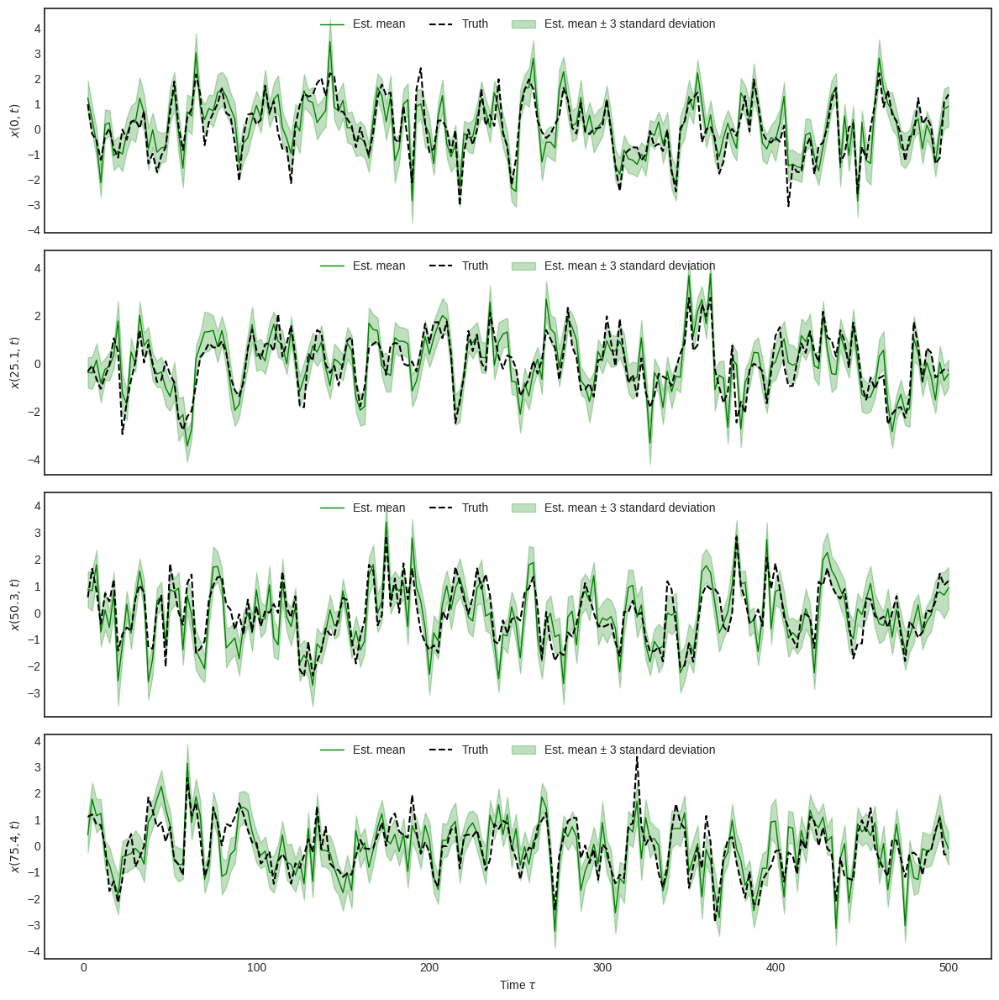

In [10]:
fig, axes = plot_results(
    results_enkf, range(0, model.dim_state, model.dim_state // 4), True,  
    times[observation_time_indices], model.mesh_node_coords[:, 0],
    state_sequence[observation_time_indices])

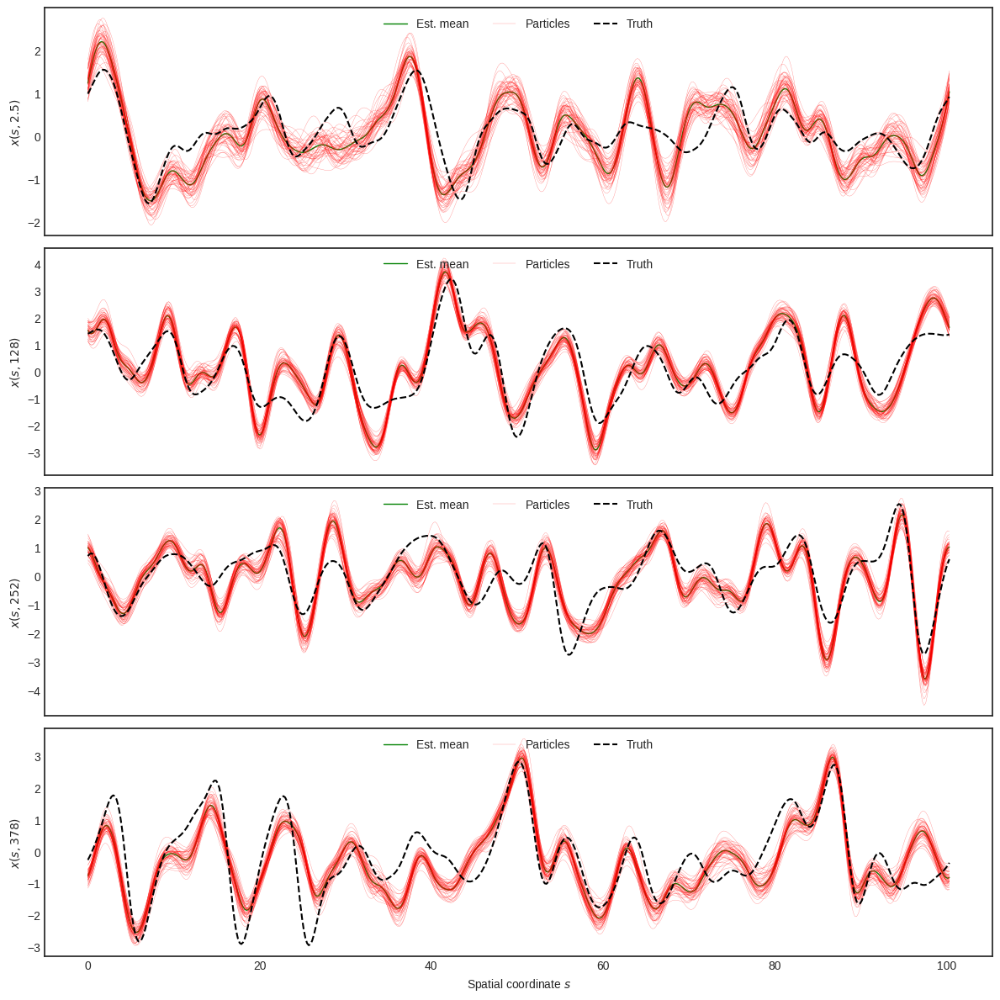

In [11]:
fig, axes = plot_results(
    results_enkf, range(0, len(observation_time_indices), 50), False,
    model.mesh_node_coords[:, 0], times[observation_time_indices],
    state_sequence[observation_time_indices], True, False)

### Ensemble transform Kalman filter (square root filter)

In [12]:
etkf = filters.EnsembleTransformKalmanFilter()

In [13]:
results_etkf = etkf.filter(
    model, observation_sequence, observation_time_indices, 
    num_particle=100, rng=rng, return_particles=True)

Filtering: 100%|██████████|2001/2001 [00:22<00:00, 89.06time-steps/s]

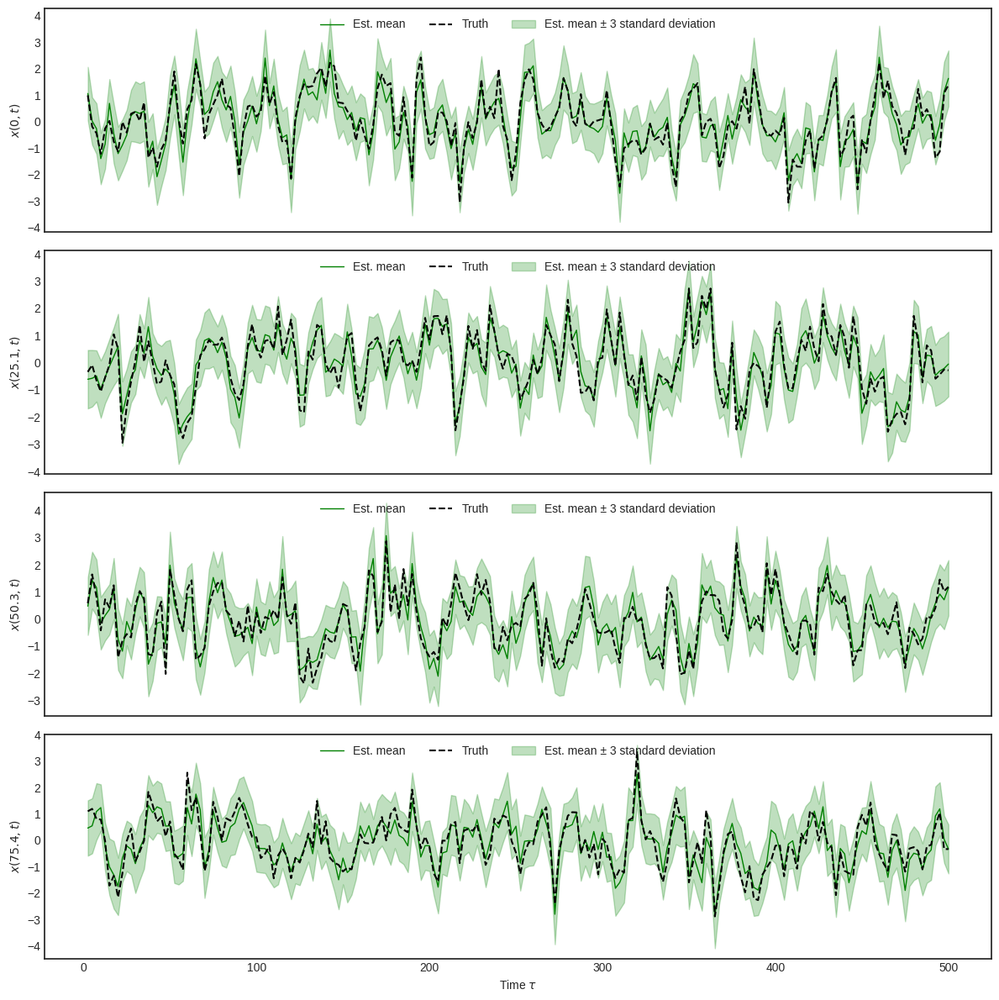

In [14]:
fig, axes = plot_results(
    results_etkf, range(0, model.dim_state, model.dim_state // 4), True,  
    times[observation_time_indices], model.mesh_node_coords[:, 0],
    state_sequence[observation_time_indices])

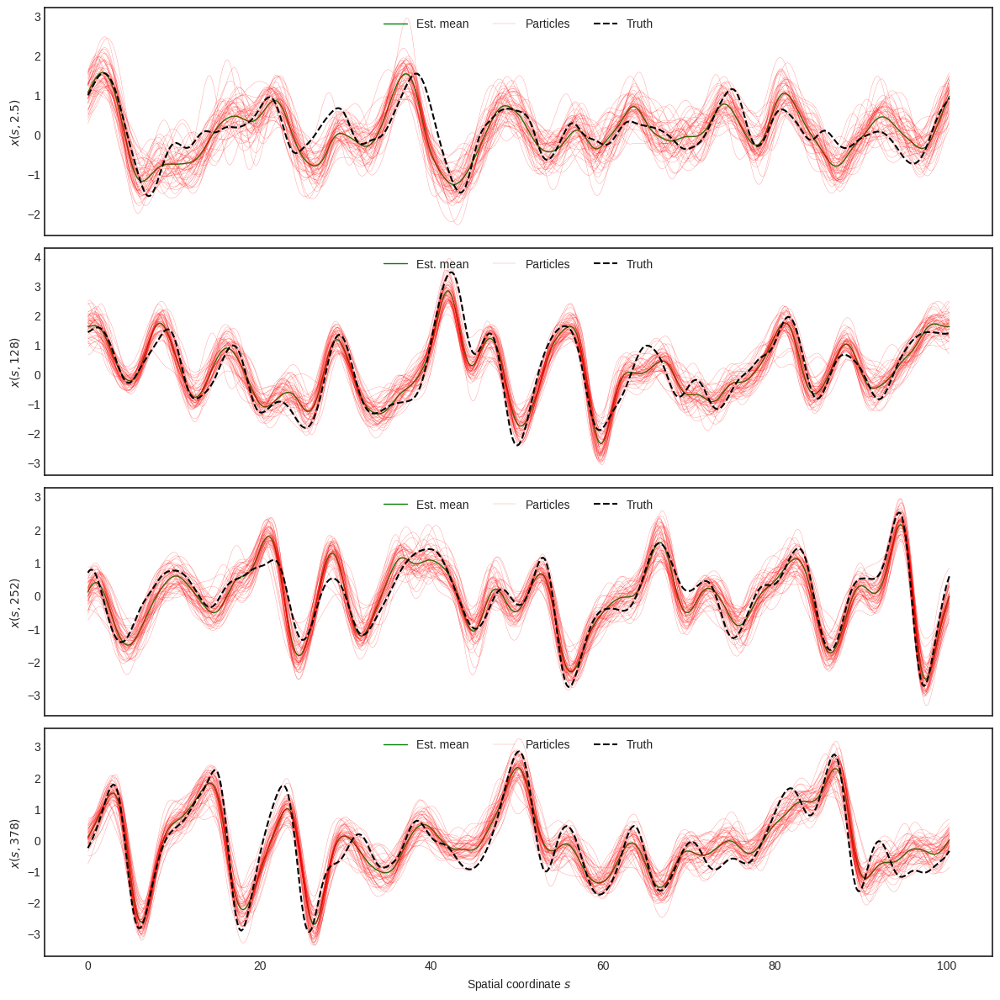

In [15]:
fig, axes = plot_results(
    results_etkf, range(0, len(observation_time_indices), 50), False,
    model.mesh_node_coords[:, 0], times[observation_time_indices],
    state_sequence[observation_time_indices], True, False)

### Local ensemble transform Kalman filter

In [16]:
letkf = filters.LocalEnsembleTransformKalmanFilter(localisation_radius=4.)

In [17]:
results_letkf = letkf.filter(
    model, observation_sequence, observation_time_indices, 
    num_particle=100, rng=rng, return_particles=True)

Filtering: 100%|██████████|2001/2001 [01:01<00:00, 32.63time-steps/s]

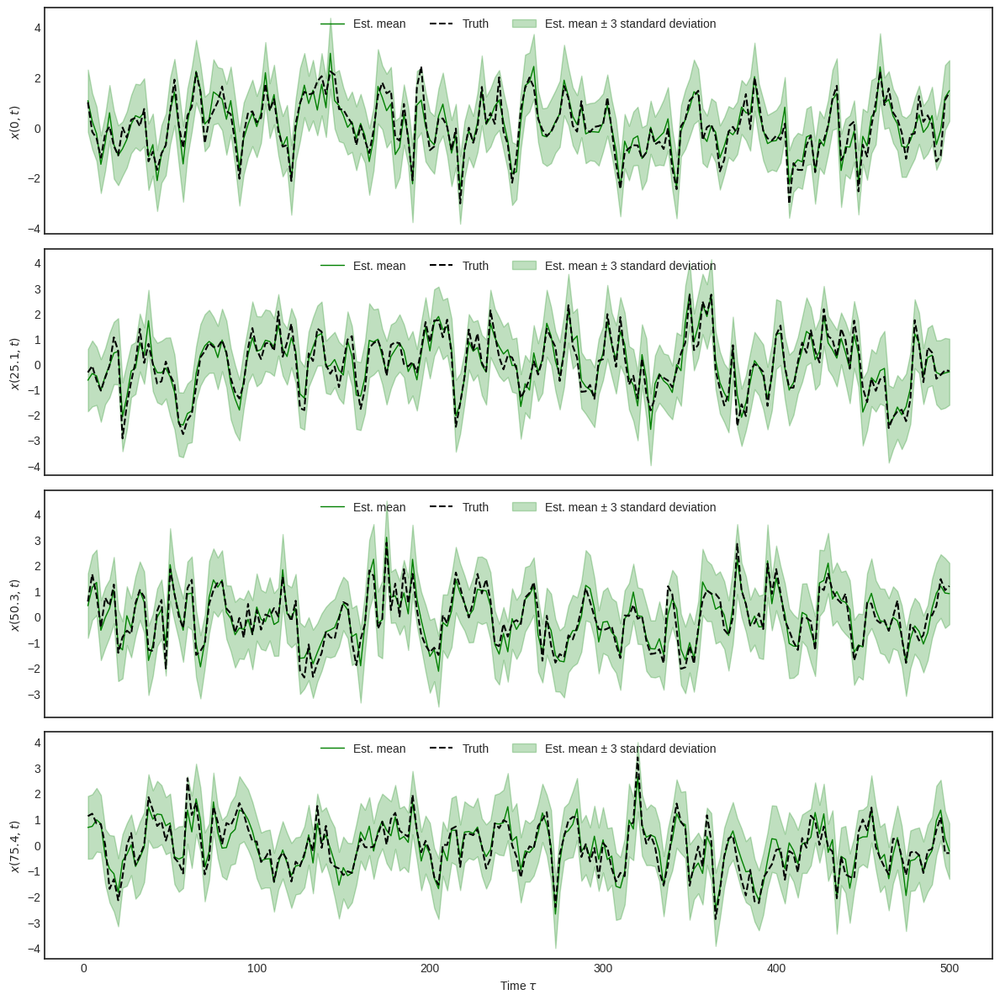

In [18]:
fig, axes = plot_results(
    results_letkf, range(0, model.dim_state, model.dim_state // 4), True,  
    times[observation_time_indices], model.mesh_node_coords[:, 0],
    state_sequence[observation_time_indices])

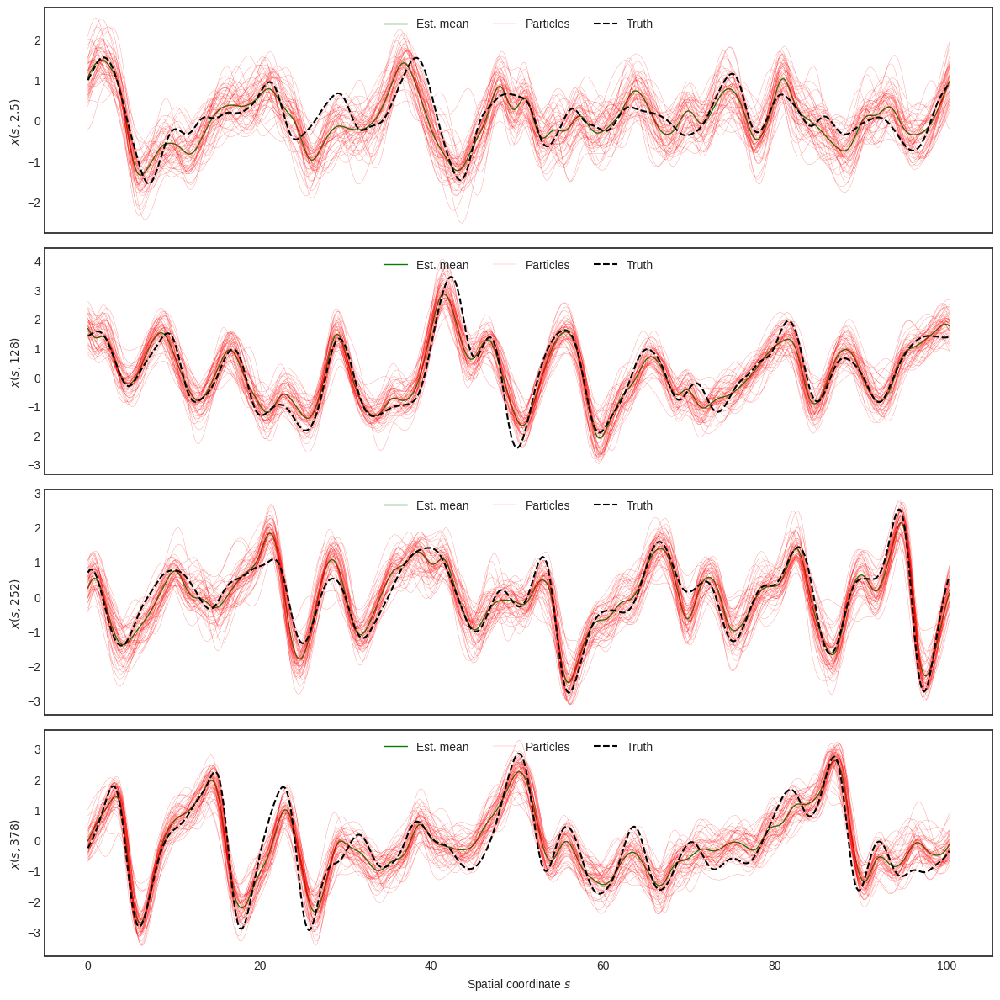

In [19]:
fig, axes = plot_results(
    results_letkf, range(0, len(observation_time_indices), 50), False,
    model.mesh_node_coords[:, 0], times[observation_time_indices],
    state_sequence[observation_time_indices], True, False)

### Bootstrap particle filter

In [20]:
bspf = filters.BootstrapParticleFilter()

In [21]:
results_bspf = bspf.filter(
    model, observation_sequence, observation_time_indices, 
    num_particle=100, rng=rng, return_particles=True)

Filtering: 100%|██████████|2001/2001 [00:20<00:00, 99.11time-steps/s]

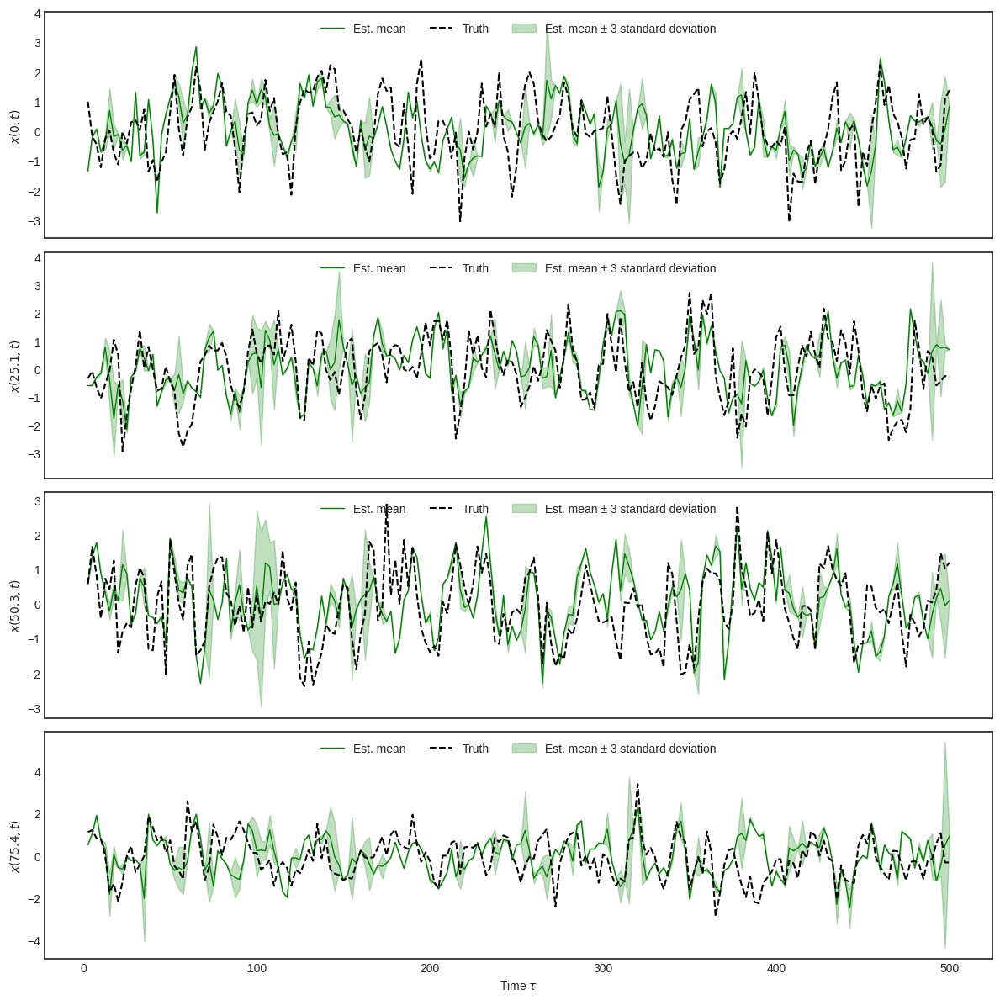

In [22]:
fig, axes = plot_results(
    results_bspf, range(0, model.dim_state, model.dim_state // 4), True,  
    times[observation_time_indices], model.mesh_node_coords[:, 0],
    state_sequence[observation_time_indices])

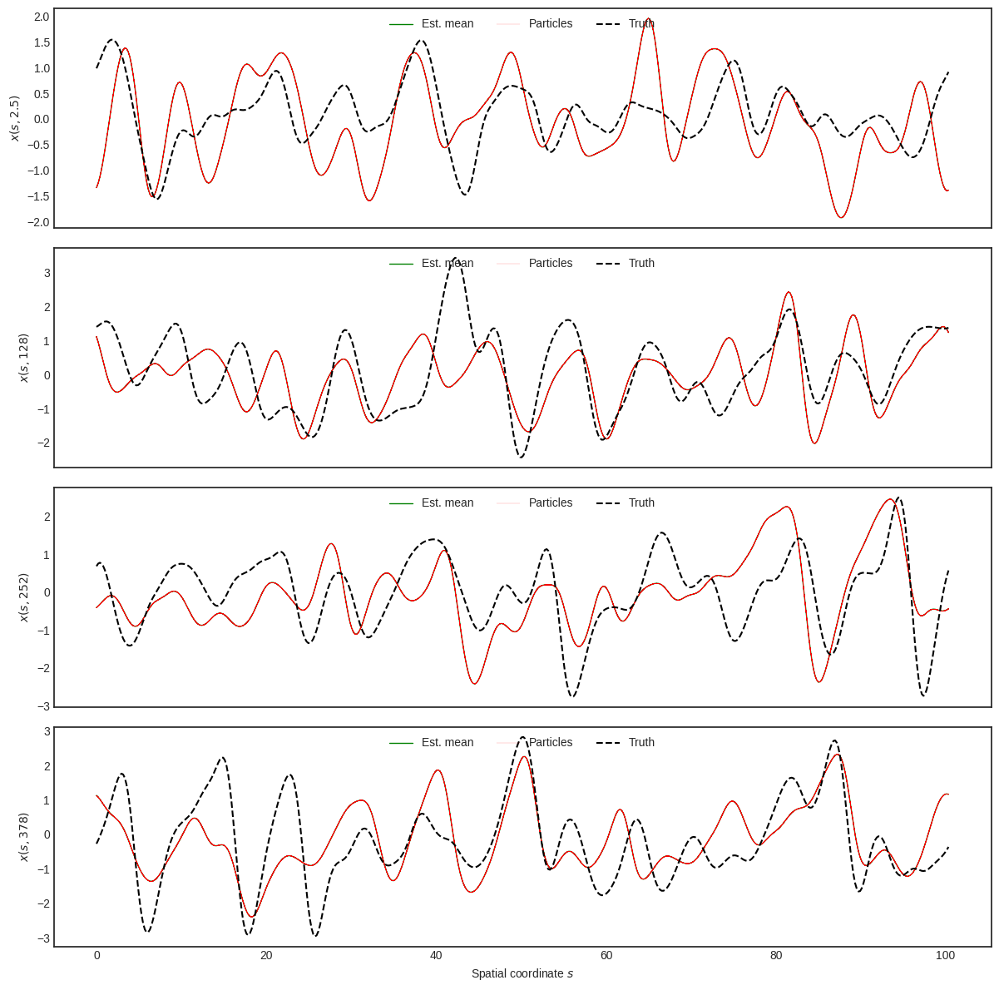

In [23]:
fig, axes = plot_results(
    results_bspf, range(0, len(observation_time_indices), 50), False,
    model.mesh_node_coords[:, 0], times[observation_time_indices],
    state_sequence[observation_time_indices], True, False)

### Ensemble transform particle filter

In [24]:
etpf = filters.EnsembleTransformParticleFilter()

In [25]:
results_etpf = etpf.filter(
    model, observation_sequence, observation_time_indices, 
    num_particle=100, rng=rng, return_particles=True)

Filtering: 100%|██████████|2001/2001 [00:29<00:00, 68.12time-steps/s]

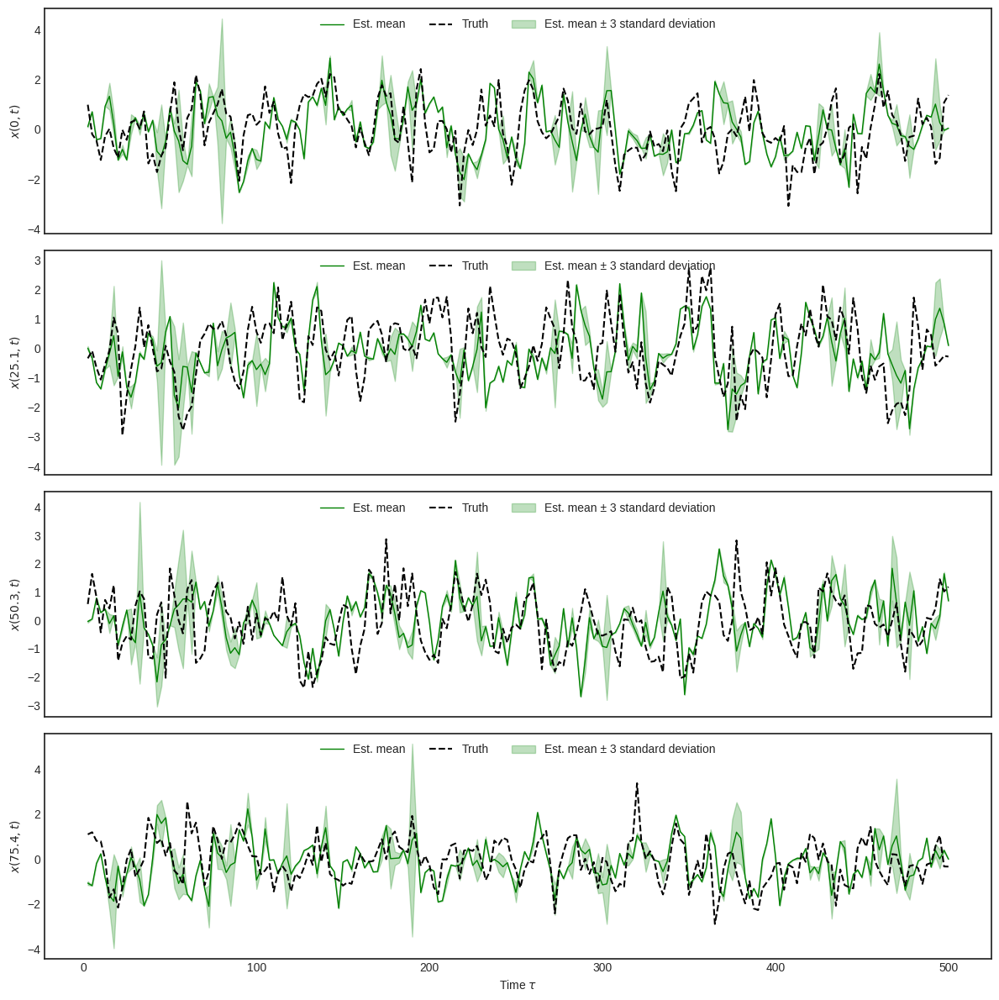

In [26]:
fig, axes = plot_results(
    results_etpf, range(0, model.dim_state, model.dim_state // 4), True,  
    times[observation_time_indices], model.mesh_node_coords[:, 0],
    state_sequence[observation_time_indices])

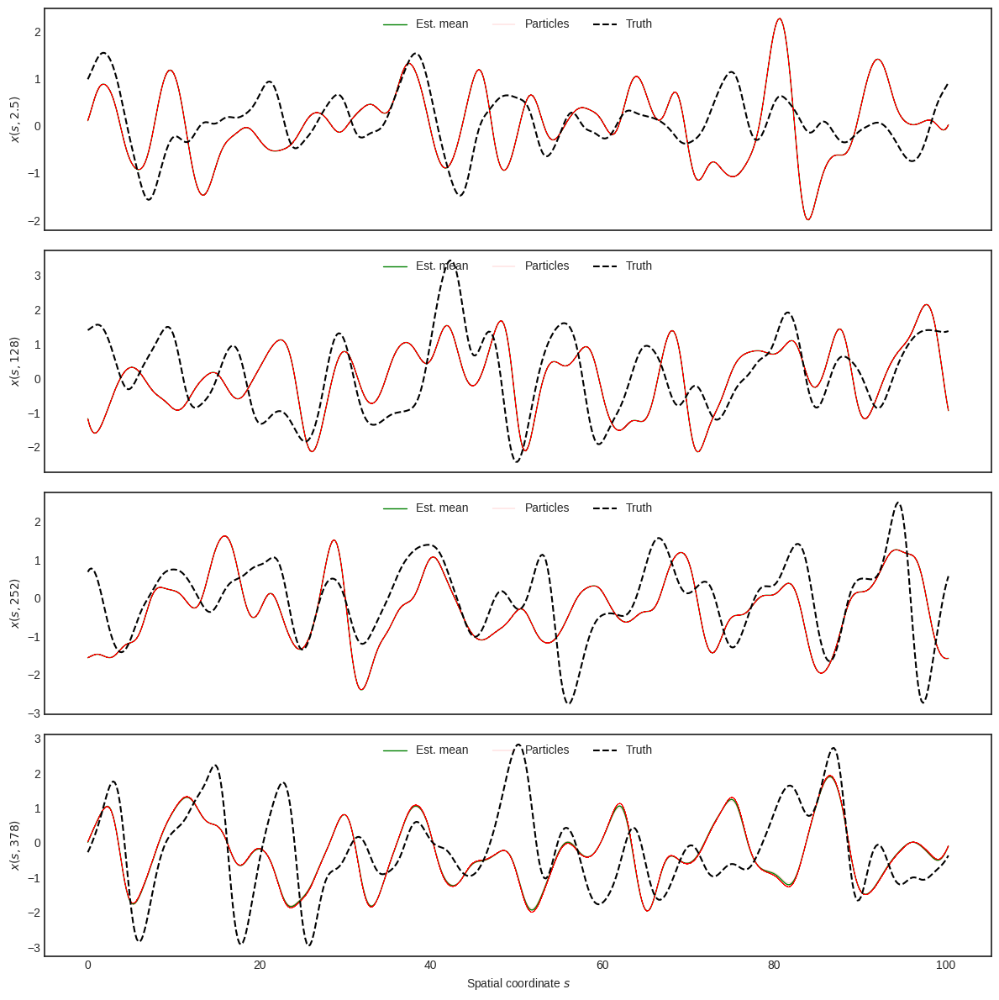

In [27]:
fig, axes = plot_results(
    results_etpf, range(0, len(observation_time_indices), 50), False,
    model.mesh_node_coords[:, 0], times[observation_time_indices],
    state_sequence[observation_time_indices], True, False)

### Local ensemble transform particle filter

In [28]:
letpf = filters.LocalEnsembleTransformParticleFilter(localisation_radius=4.)

In [29]:
results_letpf = letpf.filter(
    model, observation_sequence, observation_time_indices, 
    num_particle=100, rng=rng, return_particles=True)

Filtering: 100%|██████████|2001/2001 [02:55<00:00, 11.41time-steps/s]

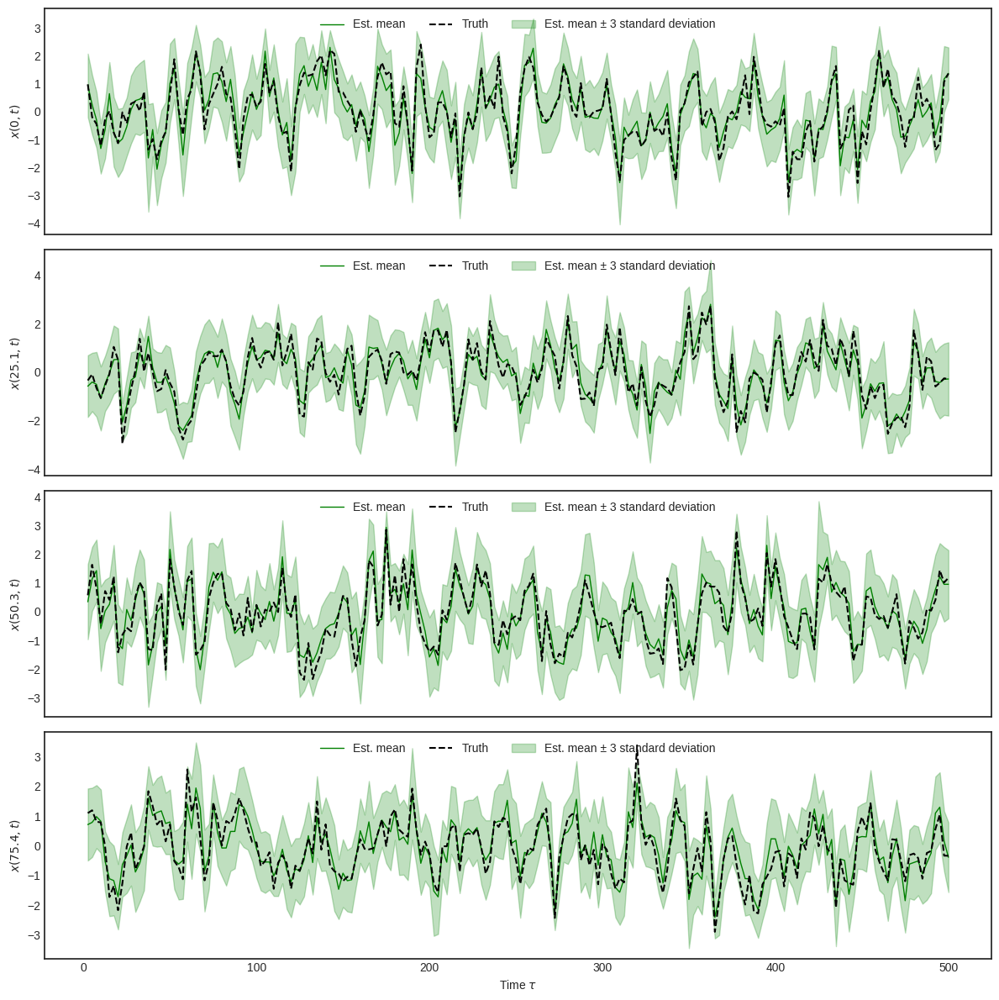

In [30]:
fig, axes = plot_results(
    results_letpf, range(0, model.dim_state, model.dim_state // 4), True,  
    times[observation_time_indices], model.mesh_node_coords[:, 0],
    state_sequence[observation_time_indices])

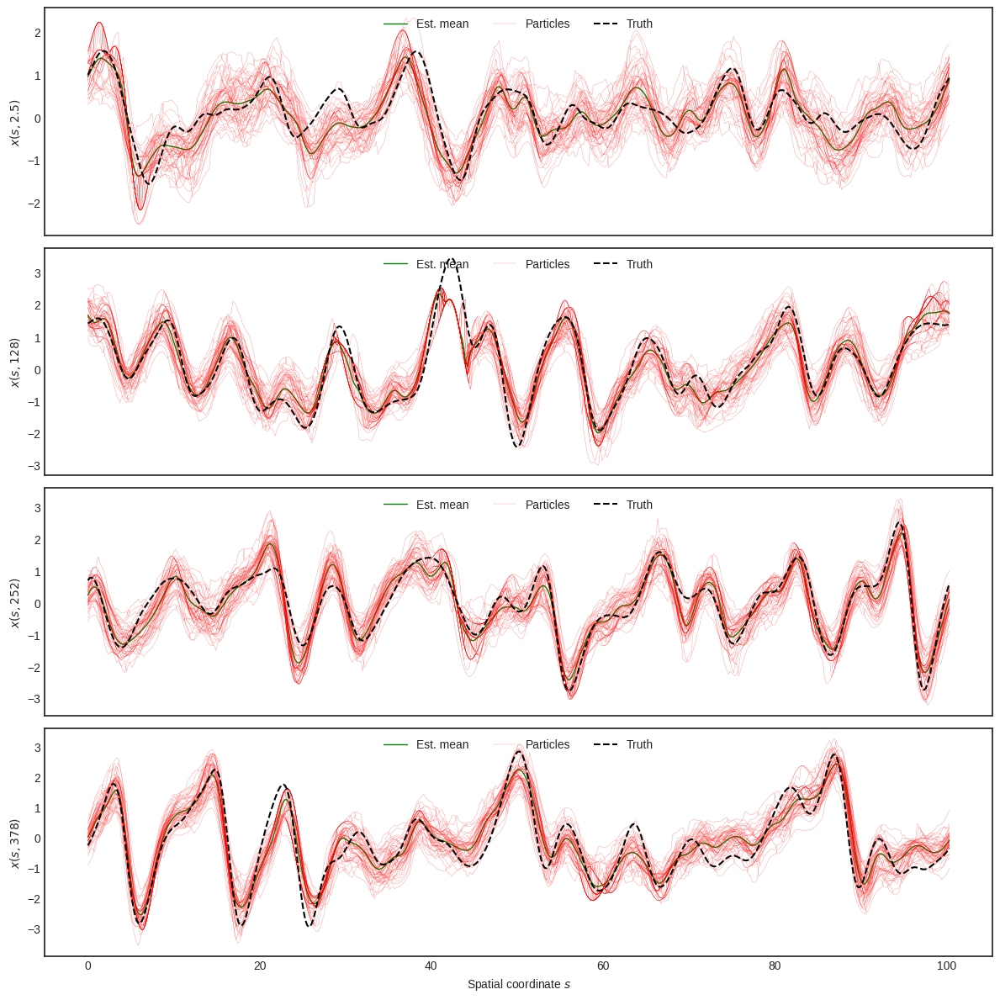

In [31]:
fig, axes = plot_results(
    results_letpf, range(0, len(observation_time_indices), 50), False,
    model.mesh_node_coords[:, 0], times[observation_time_indices],
    state_sequence[observation_time_indices], True, False)

### Scalable localised ensemble transform particle filter

In [32]:
partition_of_unity = pou.SmoothedBlock1dPartitionOfUnityBasis(model, 32, kernel_halfwidth=6)

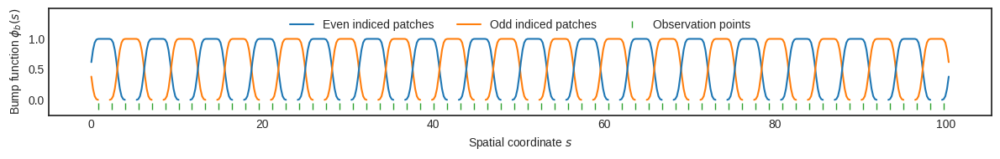

In [33]:
patch_coords = partition_of_unity.split_into_patches(model.mesh_node_coords[:, 0])
patch_bumps = partition_of_unity.split_into_patches_and_scale(np.ones(model.mesh_size))
fig, ax = plt.subplots(figsize=(12, 2))
for p, (bump, coords) in enumerate(zip(patch_bumps, patch_coords)):
    if coords[0] < coords[-1]:
        ax.plot(coords, bump, color=f'C{p%2}')
    else:
        split = np.argmin(coords)
        ax.plot(coords[:split], bump[:split], color=f'C{p%2}')
        ax.plot(coords[split:], bump[split:], color=f'C{p%2}')
ax.plot(model.observation_coords[:, 0], -0.1 * np.ones(model.dim_observation), '|', 
        color='C2')
ax.set_ylabel('Bump function $\\phi_b(s)$')
ax.set_xlabel('Spatial coordinate $s$')
custom_handles = [
    plt.Line2D([0], [0], color='C0', label='Even indiced patches'),
    plt.Line2D([0], [0], color='C1', label='Odd indiced patches'),
    plt.Line2D([0], [0], color='C2', linestyle='', marker='|', label='Observation points')
]
ax.legend(handles=custom_handles, loc='upper center', ncol=3)
ax.set_ylim(-0.25, 1.5)
ax.set_yticks([0., 0.5, 1.])
fig.tight_layout()

In [34]:
sletpf = filters.ScalableLocalEnsembleTransformParticleFilter(
    localisation_radius=1., partition_of_unity=partition_of_unity)

In [35]:
results_sletpf = sletpf.filter(
    model, observation_sequence, observation_time_indices, 
    num_particle=100, rng=rng, return_particles=True)

Filtering: 100%|██████████|2001/2001 [00:44<00:00, 45.19time-steps/s]

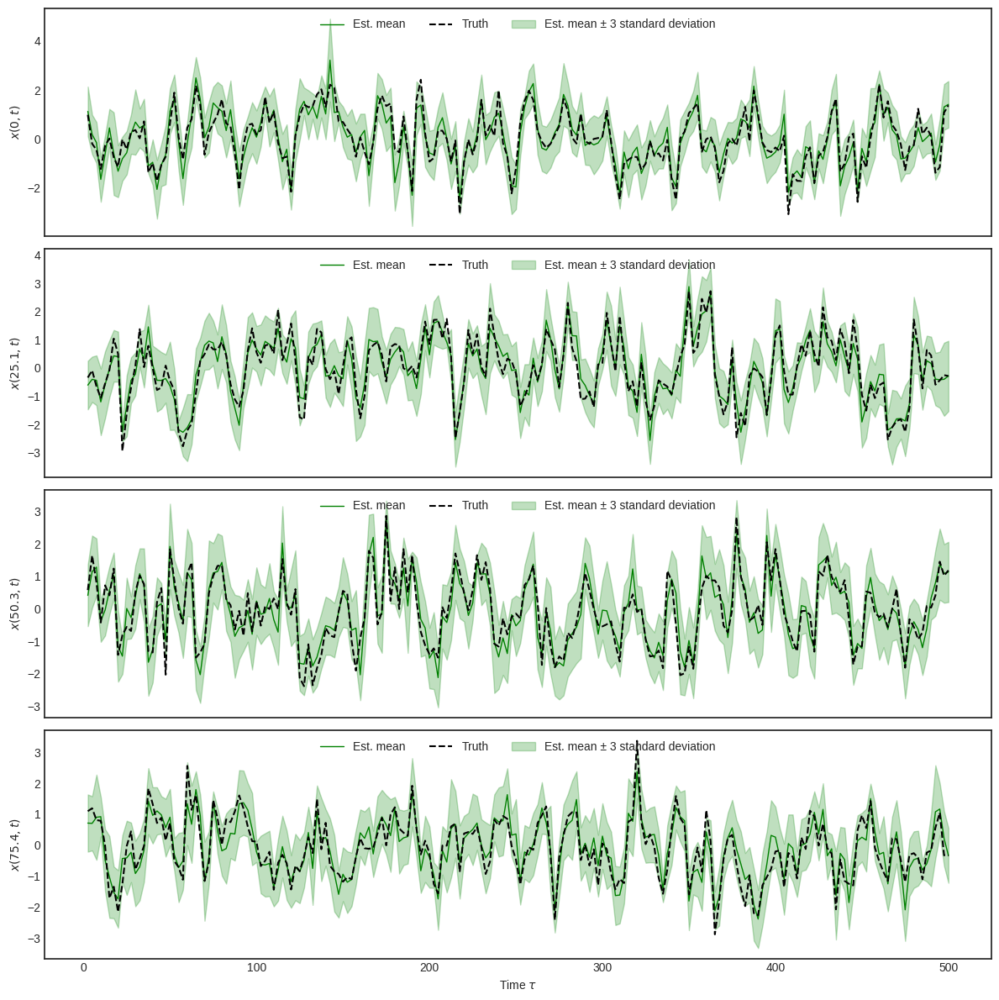

In [36]:
fig, axes = plot_results(
    results_sletpf, range(0, model.dim_state, model.dim_state // 4), True,  
    times[observation_time_indices], model.mesh_node_coords[:, 0],
    state_sequence[observation_time_indices])

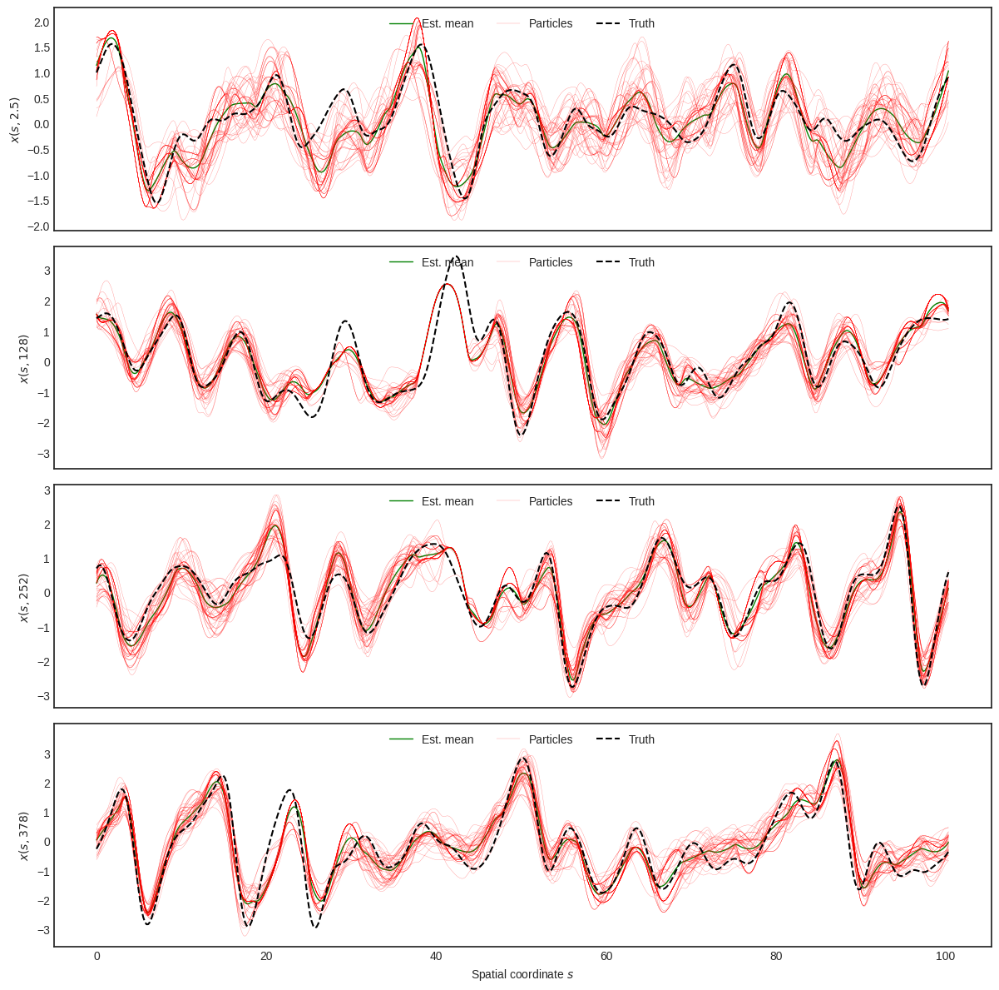

In [37]:
fig, axes = plot_results(
    results_sletpf, range(0, len(observation_time_indices), 50), False,
    model.mesh_node_coords[:, 0], times[observation_time_indices],
    state_sequence[observation_time_indices], True, False)